# 1a

In [1]:
#We use the print command to print strings or variables
#We can also just call variables to print them
#When using print you need parentheses, and when defining a string you need to use single '' or double "" quotes. You can use both single and double quotes to make the quotes part of your string
print ('"Hello World!"')

"Hello World!"


# 1b

In [2]:
#The general format for importing is "import library.module as abbreviation"
#To import classes from a module, do "from library.module import class"
import numpy as np
import pandas as pd
#Here we use the function np.zeros to define an array of zeros of shape (400,400)
arr=np.zeros([400,400])
#numpy arrays, and lots of other python objects, have a .shape method that will tell you the shape of the objct
arr.shape


(400, 400)

# 1c

In [3]:
%%timeit
#Use %%timeit at the very top of the cell to time the rest of the cell
for i in range(400): #looping through the columns
    for j in range(400): #looping through the rows
        arr[i,j]=np.random.normal(128,20) #indexing takes the form [rows,columns], so by setting arr[i,j] equal to a random number, we are assigning each point in the array a random number

358 ms ± 5.99 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [4]:
arr

array([[114.64936816, 132.29686603, 104.71707515, ..., 123.45352839,
        155.30465412, 150.47736192],
       [128.16367948, 137.20879837, 130.01289265, ..., 120.35397139,
        149.39951423, 162.54525354],
       [125.68053685, 112.60334414, 125.64769824, ..., 130.85553752,
        116.22889515, 104.88410368],
       ...,
       [111.9690993 ,  86.96465716, 120.72163454, ..., 101.57547913,
        102.35671409,  89.06782344],
       [ 92.16873801, 107.32591336, 117.08492985, ..., 127.00228425,
        159.66297773, 129.99124244],
       [126.3777818 , 161.52803685,  92.11896428, ..., 120.99550279,
        120.25382003, 140.16691067]])

# 1d and 1e

In [5]:
#%%timeit
import numpy as np
arr=np.random.normal(128,20, size=(400, 400))


In [6]:
#notice that if timeit is uncommented the array is the same as the one above. This is because when you use %%timeit, variables aren't saved.
#If you comment out the %timeit command, you'll see that arr is rewritten
arr

array([[127.12145289, 151.55720997, 145.63010735, ..., 134.14806964,
        157.94240487, 118.82501106],
       [153.32766955, 154.05924584,  95.06596446, ..., 111.51242688,
        133.72016195, 129.77424404],
       [128.08295391, 153.05827015, 130.57981811, ..., 109.29981535,
        141.14810814, 111.42356904],
       ...,
       [ 99.55014252,  90.72926708, 125.90981605, ..., 135.29931101,
         98.77384831, 143.26050112],
       [132.0274753 , 139.09988838,  90.43609971, ..., 151.85605757,
        157.83231015, 123.32885548],
       [184.97779263, 136.67094595,  98.08428696, ..., 117.20492563,
        154.52697041, 135.0787786 ]])

# 1f

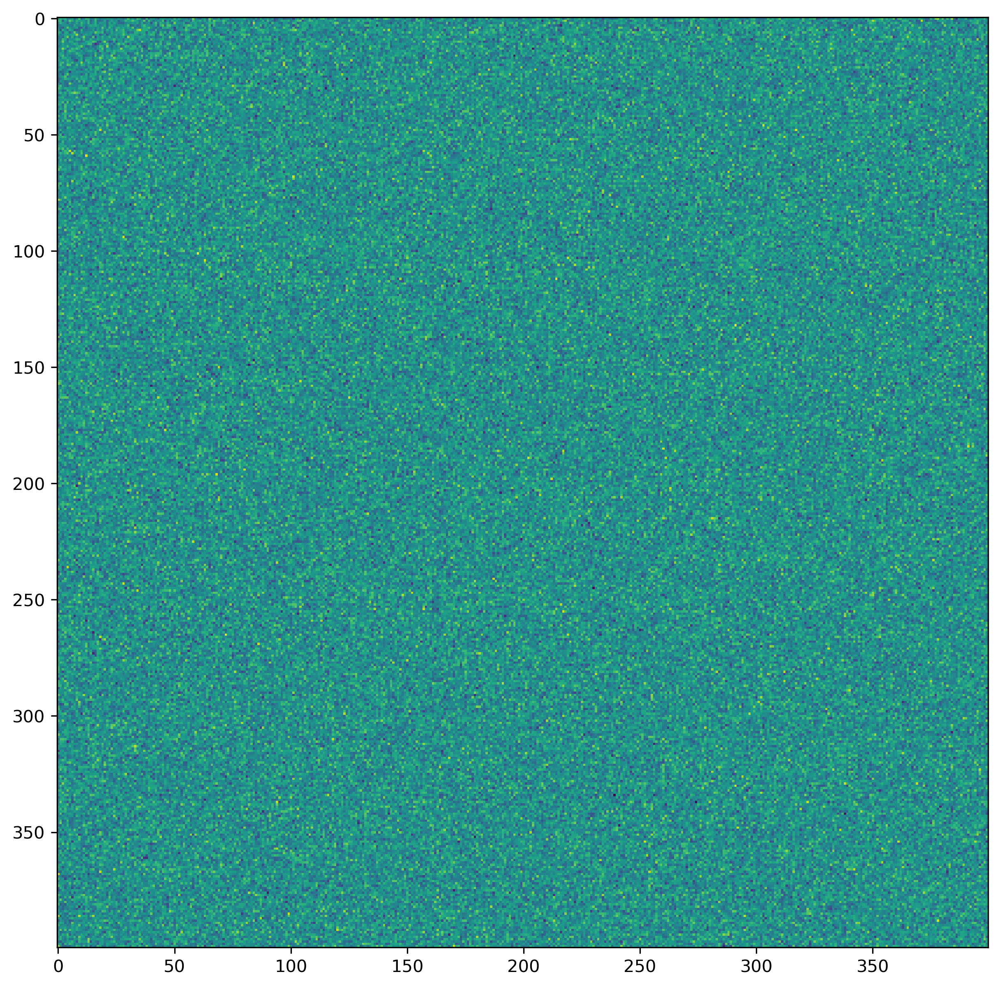

In [7]:
#Import matplotlib
import matplotlib.pyplot as plt
#Sometimes you have to do this to get your plots to show up in Jupyter notebooks. Idk exactly why.
%matplotlib inline
#Figure lets us change the size and resolution (dpi) of our plots
from matplotlib.pyplot import figure
figure(figsize=(10,10),dpi=300)
#Imshow is great for displaying image data
plt.imshow(arr)

# 1g

In [8]:
#This is correct. We have to account for 0.
#In english, this reads as "wherever the array is less than 128, set these values equal to 0"
arr[arr<128]=0
arr[arr>128]=255

In [9]:
#This is incorrrect (every value is 255, but we want low values to be 0 and high values to be 255)
#arr[arr>128]=0
#arr[arr<128]=255

# 1h

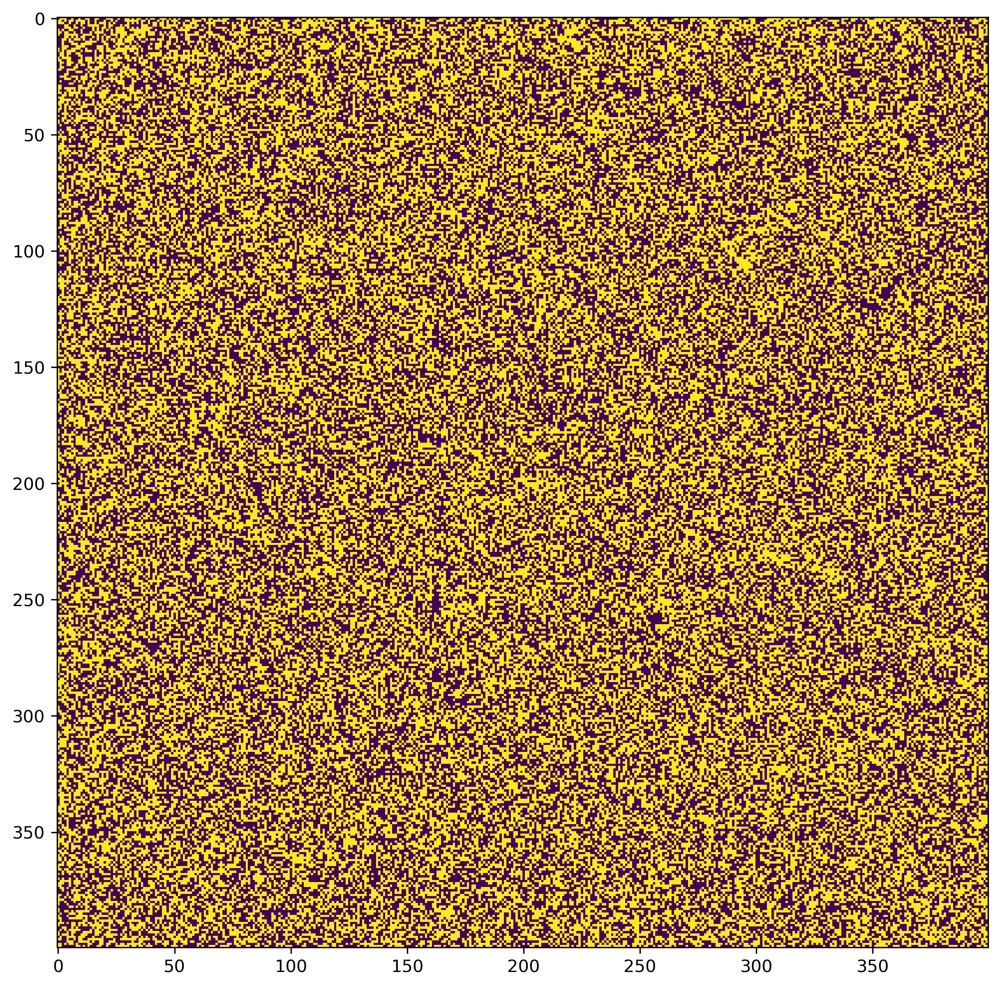

In [10]:
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
figure(figsize=(10,10),dpi=300)
plt.imshow(arr)

# 1i

In [11]:
#This is the syntax for defining a function in Python. It's not super necessary to use functions as you're learning, but they can be helpful and make you're code cleaner and easier to read
#This function takes 1 input (filename)
def parse(filename):
    count=0
    df_gw=[]
    #This package was giving people trouble but it's needed for hw2. Please let me know if you're still having trouble installing this
    import csv
    #The with open stuff is just some solution I found online for reading in tab separated data row by row
    #You can import this with pandas, but as the data gets more complicated, I've found that a line by line approach is 
    with open(filename, newline = '') as data:                                                                                          
        data_reader = csv.reader(data, delimiter='\t')
        #Here we loop through each line of data
        for row in data_reader:
            count=count+1
            #All lines before 1953 correspond to metadata. To figure this out, I just guessed and checked
            if count>1953:
                #Here we append parts of the row to a list (df_gw) that correspond to the data we want
                df_gw.append([row[6],row[1],row[3]])
    #convert list to dataframe
    df_gw=pd.DataFrame(df_gw,columns=['gw_depth','site','date'])
    return df_gw
df_gw=parse('/Users/marcberghouse/Machine-Learning-in-Hydrology/homework/hw1/USGS_data_sample.csv')
df_gw

,gw_depth,site,date
0,27.20,351651114440601,2013-03-05
1,47.57,351712114441201,2013-03-05
2,70.44,351741114442001,2013-03-05
3,586.19,354709115220001,2013-09-24
4,905.00,354849115225001,2012-05-03
...,...,...,...
30833,14.89,413444114261701,2014-02-21
30834,12.80,413444114261701,2015-02-10
30835,21.57,413444114261701,2016-04-13
30836,6.27,413444114261701,2017-05-03


# 2a

In [12]:
from sklearn.datasets import load_iris, load_diabetes
#This is a specific sklearn dataset method
iris = load_iris()
diab = load_diabetes()

In [13]:
#Data is returned as a dictionary. Different parts of the dictionary can be accessed with a period
iris.target.shape

(150,)

In [14]:
#Using np.hstack to concatenate the features and target. The target has to be reshaped to (150,1) for this to work
#pd.concat also works (with axis = 1)
iris_np=np.hstack([iris.data,iris.target.reshape([len(iris.target),1])])

In [15]:
#Turn our iris data array into a pandas dataframe with column names taken from the "feature_names" item of the iris dictionary
iris_df=pd.DataFrame(iris_np,columns=(iris.feature_names[0],iris.feature_names[1],
                                     iris.feature_names[2],iris.feature_names[3],
                                     'species'))
iris_df

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),species
0,5.1,3.5,1.4,0.2,0.0
1,4.9,3.0,1.4,0.2,0.0
2,4.7,3.2,1.3,0.2,0.0
3,4.6,3.1,1.5,0.2,0.0
4,5.0,3.6,1.4,0.2,0.0
...,...,...,...,...,...
145,6.7,3.0,5.2,2.3,2.0
146,6.3,2.5,5.0,1.9,2.0
147,6.5,3.0,5.2,2.0,2.0
148,6.2,3.4,5.4,2.3,2.0


In [16]:
#Standard commands to get
from pandas_profiling import ProfileReport
profile_iris = ProfileReport(iris_df, title="Pandas Profiling Report")
profile_iris

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [17]:
#There are some different options of the sklearn load_dataset class that change the format that the data is in. This isn't super important
#I'm just loading up the diabetes dataset here and concatenating the features and target
diab = load_diabetes(as_frame=True,return_X_y=True)
diab_df = pd.concat([diab[0],diab[1]],axis=1)

In [18]:
from pandas_profiling import ProfileReport
profile_diab = ProfileReport(pd.DataFrame(diab_df), title="Pandas Profiling Report")
profile_diab

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# 2b

In [19]:
#Importing all the models
import sklearn.linear_model as lm
import sklearn.neighbors as skn
log_reg=lm.LogisticRegression()
lin_reg=lm.LinearRegression()
#I set n_neighbors to something random here to start with
knn_reg=skn.KNeighborsRegressor(n_neighbors=25)
knn_class=skn.KNeighborsClassifier(n_neighbors=25)

# 2c

# The logistic regression and kNN classifier should be used for the Iris Dataset, and the linear regression and kNN regressor should be used for the Diabetes dataset

# 2d

In [20]:
from sklearn.datasets import load_iris, load_diabetes
iris = load_iris()
diab = load_diabetes()
#Train test split is the sklearn function that we use to split the data into training and testing sets.
#We will train the model on the training set, generate a prediction from the test set features, and evaluate with the test set target
from sklearn.model_selection import train_test_split
X_train_iris, X_test_iris, y_train_iris, y_test_iris = train_test_split(iris.data, iris.target, test_size=0.2, random_state=42)
X_train_diab, X_test_diab, y_train_diab, y_test_diab = train_test_split(diab.data, diab.target, test_size=0.2, random_state=42)



# 2e

In [21]:
#For claculation of RMSE
from sklearn.metrics import mean_squared_error

In [22]:
#If you're just testing a couple values, this is the simplest way to do it
# knn_reg.fit(X_train_diab, y_train_diab)
# y_pred=knn_reg.predict(X_test_diab)
# print ('R2: ',knn_reg.score(X_test_diab,y_test_diab))
# print ('RMSE: ',mean_squared_error(y_pred,y_test_diab,squared=False))

#If you want to test a range of n_neighbor values, we can write a simple for loop
best_i=0 #This will be used to record the best value of n_neighbors
for i in range(1,50):  #looping from 1 to 50
    knn_reg=skn.KNeighborsRegressor(n_neighbors=i)  #with each loop, we set a different value for n_neighbors
    knn_reg.fit(X_train_diab, y_train_diab)   #fit the model
    y_pred=knn_reg.predict(X_test_diab)   #predict the target test values
    if i==1:
        best_r2=knn_reg.score(X_test_diab,y_test_diab) #For the first loop, the best r2 is just the r2
    else:
        if knn_reg.score(X_test_diab,y_test_diab)>best_r2: #For every loop after, we ask if our new score is better than our old best r2
            best_r2=knn_reg.score(X_test_diab,y_test_diab)  #If it's better, set a new best_r2, best_rmse, and best n_neighbors
            best_rmse=mean_squared_error(y_pred,y_test_diab,squared=False)
            best_i=i 
            
        

print ('R2: ',best_r2,' NN = ',str(best_i))
print ('RMSE: ',best_rmse,' NN = ',str(best_i))



R2:  0.4426043044910202  NN =  6
RMSE:  54.34304903827654  NN =  6


# 2f

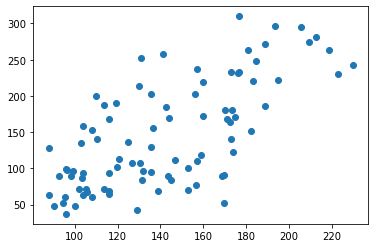

In [23]:
plt.scatter(y_pred,y_test_diab)

In [24]:
lin_reg.fit(X_train_diab, y_train_diab)
y_pred=lin_reg.predict(X_test_diab)
print ('R2: ',lin_reg.score(X_test_diab,y_test_diab))
print ('RMSE: ',mean_squared_error(y_pred,y_test_diab,squared=False))

R2:  0.4526066021617383
RMSE:  53.85325698491438


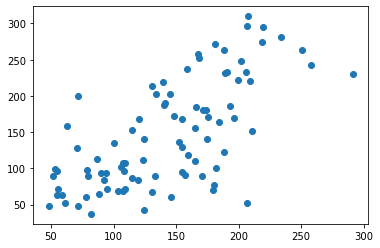

In [25]:
plt.scatter(y_pred,y_test_diab)

# 2g

In [26]:
import sklearn.metrics as skm
best_i=0
equal_list=[]

#same setup as KNeighborsRegressor to try and find the best value of n_neighbors. Here, we score the model by calculating the percent of correct binary predictions.
#This is calculated as the sum of the diagonals of the confusion matrix divided by the total number of samples
#For this one I also included an equal list, to tell me which values of n_neighbors also give the best possible classification performance
for i in range(1,100):
    knn_class=skn.KNeighborsClassifier(n_neighbors=i)
    knn_class.fit(X_train_iris, y_train_iris)
    y_pred=knn_class.predict(X_test_iris)
    if i==1:
        best_mat=skm.confusion_matrix(y_pred,y_test_iris)
        best_score=(best_mat[0,0]+best_mat[1,1]+best_mat[2,2])/30
        best_i=1
    else:
        new_mat=skm.confusion_matrix(y_pred,y_test_iris)
        if (new_mat[0,0]+new_mat[1,1]+new_mat[2,2])/30>best_score:
            best_mat=skm.confusion_matrix(y_pred,y_test_iris)
            best_score=(new_mat[0,0]+new_mat[1,1]+new_mat[2,2])/30
            best_i=i
        elif (new_mat[0,0]+new_mat[1,1]+new_mat[2,2])/30==best_score:
            equal_list.append(i)
            
        

print ('Classification Performance: ',best_score,' NN = ',str(best_i))


Classification Performance:  1.0  NN =  1


In [27]:
equal_list

[2,
 3,
 4,
 5,
 6,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 37,
 39,
 41,
 42,
 43,
 45]

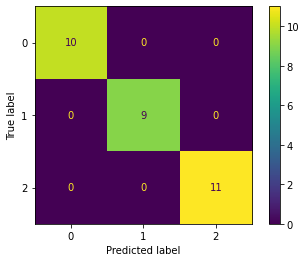

In [28]:
#We already have a confusion matrix defined as "best_mat", but now we need to plot it
#plt.show() isn't necessary here, but if you are having trouble getting your plots to show up, it's something you can try
disp=skm.ConfusionMatrixDisplay(best_mat)
disp.plot()
#plt.show()

In [29]:
from sklearn.datasets import load_iris, load_diabetes
iris = load_iris()
diab = load_diabetes()
from sklearn.model_selection import train_test_split
X_train_iris, X_test_iris, y_train_iris, y_test_iris = train_test_split(iris.data, iris.target, test_size=0.2)
X_train_diab, X_test_diab, y_train_diab, y_test_diab = train_test_split(diab.data, diab.target, test_size=0.2)


In [30]:
import sklearn
import sklearn.linear_model
log_reg=sklearn.linear_model.LogisticRegression(max_iter=200)
log_reg.fit(X_train_iris, y_train_iris)
y_pred=log_reg.predict(X_test_iris)
print ('accuracy: ',log_reg.score(X_test_iris,y_test_iris))

accuracy:  1.0


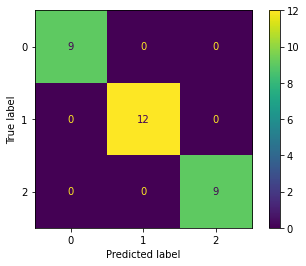

In [31]:
import sklearn.metrics as skm
mat=skm.confusion_matrix(y_pred,y_test_iris)
disp=skm.ConfusionMatrixDisplay(mat)
disp.plot()


# 2h

## The classifcation models (logistic regression and knn classification) perform equally well, and the regression models (linear regression and knn regression) also perform equally well. For classification, since they both have the best performance possible, we really can't say anything about the models othere than that they both work, and the data is probably pretty easy to predict (which we can see from the high correlation values in the Pandas profiler for the Iris dataset). For regression, we might expect knn to do better because it can handle some non-linearities, but you also need a lot of data and at least one of the features should be highly correlated with the target. Since we don't have these things, the models basically perform the same.